1. распределение разности итогового счёта
2. распределение количества равного счёта
3. распределение количества смен лидерства
    - пример самых качельных игр
3. итоговая разность Vs очков у победителя
4. итоговая разность Vs смены лидерства
5. проверка формулы https://ru.wikipedia.org/wiki/Теорема_Бертрана_о_выборах

In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns; sns.set(style='whitegrid')
import numpy as np
import pandas as pd
import tqdm
import glob
import os

pd.options.display.max_rows = 99
pd.options.display.max_columns = 60

from nba_api.stats.static import teams, players
import nba_api.stats.endpoints as endp
from nba_api.stats.endpoints import boxscoresummaryv2, leaguegamefinder,\
playbyplayv2, commonplayerinfo, commonallplayers
from nba_api.stats.library.parameters import Season, SeasonType, LeagueIDNullable, SeasonSegment
from nba_api.stats.library.eventmsgtype import EventMsgType
import nba_api.stats.library.playbyplayregex as prex

import altair as alt
from altair_saver import save as alt_save

pd.set_option('max_columns', 120)
pd.set_option('max_rows', 50)

In [2]:
all_games = sorted(glob.glob('../2015_match_stats/*csv')
             + glob.glob('../2016_match_stats/*csv')
             + glob.glob('../2017_match_stats/*csv')
             + glob.glob('../2018_match_stats/*csv')
             + glob.glob('../2019_match_stats/*csv')
             + glob.glob('../2020_match_stats/*csv')
             + glob.glob('../2021_match_stats/*csv')
            )
print(len(all_games) / 9)

8289.0


In [3]:
def read_info(fpath):
    res = pd.read_csv(fpath)
    g_id = fpath[-16:-6]
    res['GAME_ID'] = int(g_id)
    return res
df_infos = pd.concat([read_info(fpath) 
                    for fpath in all_games[:]
                    if fpath.endswith('_1.csv')], 
                   axis=0)
print(df_infos.shape, df_infos.GAME_ID.nunique())
df_infos.head(2)

(16578, 15) 8289


,LEAGUE_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY,PTS_PAINT,PTS_2ND_CHANCE,PTS_FB,LARGEST_LEAD,LEAD_CHANGES,TIMES_TIED,TEAM_TURNOVERS,TOTAL_TURNOVERS,TEAM_REBOUNDS,PTS_OFF_TO,GAME_ID
0,0,1610612740,NOP,New Orleans,64,32,17,23,7,6,0,9,9,9,21400001
1,0,1610612753,ORL,Orlando,48,19,10,6,7,6,0,18,6,27,21400001


In [4]:
df_pts = pd.concat([pd.read_csv(fpath) 
                    for fpath in all_games[:]
                    if fpath.endswith('_5.csv')], 
                   axis=0)
print(df_pts.shape, df_pts.GAME_ID.nunique())
df_pts.head(2)

(16578, 23) 8289


,GAME_DATE_EST,GAME_SEQUENCE,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY_NAME,TEAM_NICKNAME,TEAM_WINS_LOSSES,PTS_QTR1,PTS_QTR2,PTS_QTR3,PTS_QTR4,PTS_OT1,PTS_OT2,PTS_OT3,PTS_OT4,PTS_OT5,PTS_OT6,PTS_OT7,PTS_OT8,PTS_OT9,PTS_OT10,PTS
0,2014-10-28T00:00:00,1,21400001,1610612740,NOP,New Orleans,Pelicans,1-0,24,24,30,23,0,0,0,0,0,0,0,0,0,0,101
1,2014-10-28T00:00:00,1,21400001,1610612753,ORL,Orlando,Magic,0-1,25,16,23,20,0,0,0,0,0,0,0,0,0,0,84


# points difference

In [5]:
diff_by_game = (df_pts
                .groupby('GAME_ID')
                .agg({'PTS': ('min', 'max'),
                      'GAME_DATE_EST': ('first')})
                .reset_index()
               )
print(diff_by_game.shape)
diff_by_game['SEASON'] = diff_by_game.GAME_ID.astype(str).str[1:3].astype(int).map(lambda i: f'20{i}-{i+1}')
diff_by_game['dif'] = diff_by_game[('PTS', 'max')] - diff_by_game[('PTS', 'min')]
diff_by_game['ssum'] = diff_by_game[('PTS', 'max')] + diff_by_game[('PTS', 'min')]

diff_by_game['game_date'] = pd.to_datetime(diff_by_game[('GAME_DATE_EST', 'first')])
diff_by_game.columns = ["_".join([c for c in cc if c not in ['first', '']]) for cc in diff_by_game.columns]
diff_by_game.head()

(8289, 4)


,GAME_ID,PTS_min,PTS_max,GAME_DATE_EST,SEASON,dif,ssum,game_date
0,21400001,84,101,2014-10-28T00:00:00,2014-15,17,185,2014-10-28
1,21400002,100,101,2014-10-28T00:00:00,2014-15,1,201,2014-10-28
2,21400003,90,108,2014-10-28T00:00:00,2014-15,18,198,2014-10-28
3,21400004,106,108,2014-10-29T00:00:00,2014-15,2,214,2014-10-29
4,21400005,91,103,2014-10-29T00:00:00,2014-15,12,194,2014-10-29


,count,mean,std,min,25%,50%,75%,max
SEASON,,,,,,,,
2014-15,1230.0,11.111382,7.981658,1.0,5.0,9.0,15.0,53.0
2015-16,1230.0,11.089431,7.874946,1.0,5.0,9.0,15.0,51.0
2016-17,1230.0,11.322764,8.302110,1.0,5.0,9.0,16.0,49.0
2017-18,1230.0,11.128455,8.183399,1.0,5.0,9.0,15.0,61.0
2018-19,1230.0,11.739024,8.778590,1.0,5.0,9.0,16.0,56.0
2019-20,1059.0,11.412653,8.535408,1.0,5.0,9.0,15.0,49.0
2020-21,1080.0,12.184259,9.102869,1.0,5.0,10.0,17.0,57.0


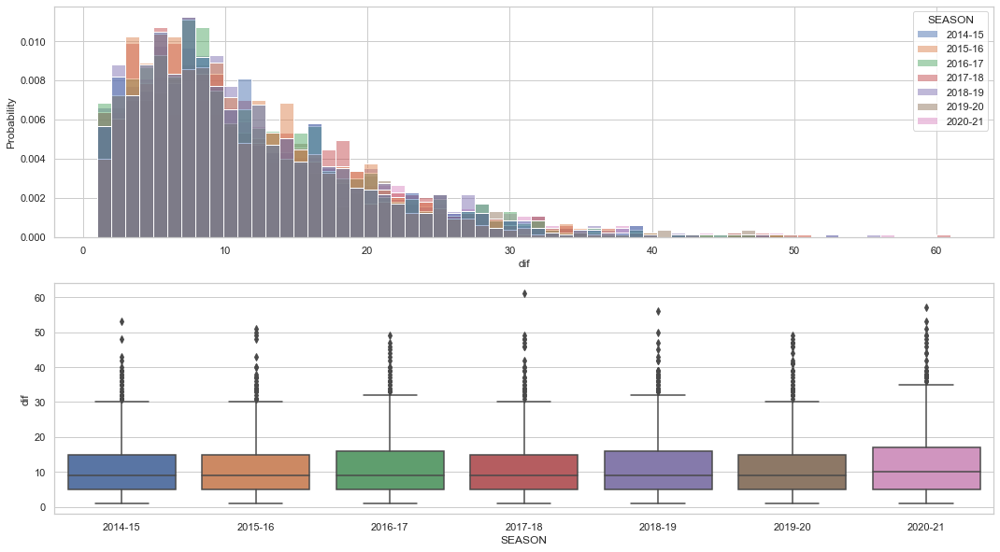

In [6]:
_, ax = plt.subplots(2, 1, figsize=(18, 10))
sns.histplot(data=diff_by_game, x='dif', stat='probability', bins=diff_by_game.dif.max(), hue='SEASON', ax=ax[0])
sns.boxplot(data=diff_by_game, y='dif', x='SEASON', ax=ax[1]);
diff_by_game.groupby('SEASON').dif.describe()

In [7]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [8]:
tt = alt.Chart(diff_by_game, height=400, width=400)
lines = (tt
         .mark_boxplot(color='blue')
         .encode(x=alt.X('SEASON', title='Сезон'), 
                 y=alt.Y('dif', title='Разница в счёте', 
                        )
                )
        )

(lines
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

h1 = lines

bar = tt.mark_bar().encode(
    x=alt.X('dif:Q', bin=alt.Bin(maxbins=diff_by_game.dif.max()), title='Разница в счёте', 
            axis=alt.Axis(values=np.arange(1, diff_by_game.dif.max(), 5))),
    y=alt.Y('count()', title='Сколько раз встречалась такая разница')
)

# rule = base.mark_rule(opacity=.5, color='red', tooltip='fff').encode(
#     x=alt.X('median(dif):Q'),
#     size=alt.value(5)
# )

h2 = bar# + rule
(alt.hconcat(h1, h2)
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

alt.HConcatChart(...)

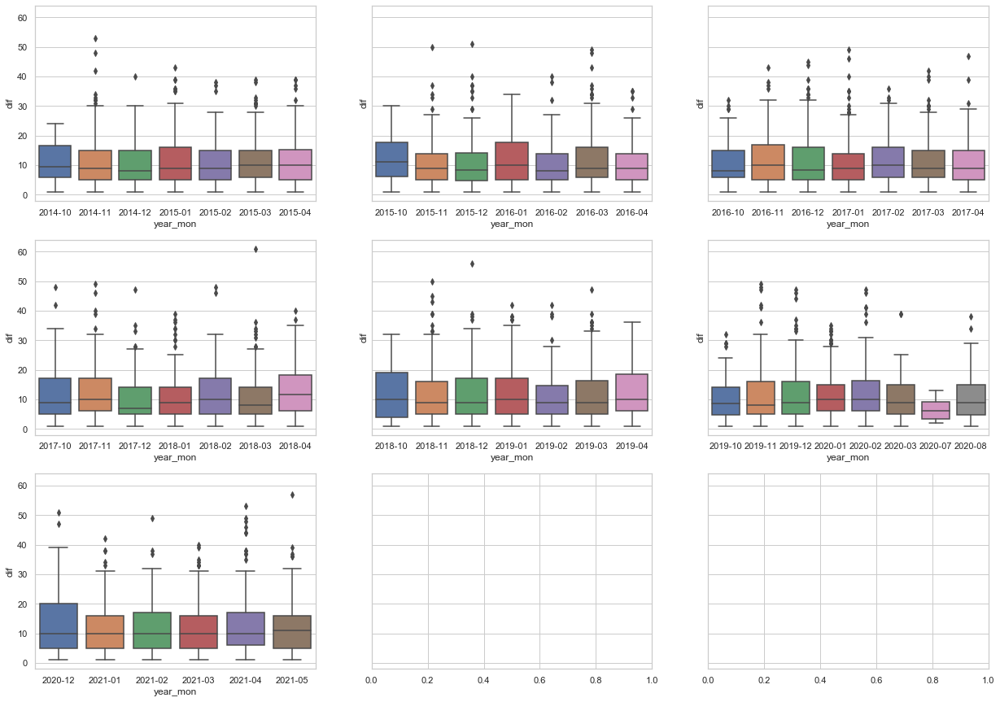

In [9]:
diff_by_game['year_mon'] = diff_by_game.game_date.dt.strftime("%Y-%m")
_, ax = plt.subplots(3, 3, figsize=(21, 15), sharey=True)
for _ax, s in zip(ax.flatten(), diff_by_game.SEASON.unique()):
    sns.boxplot(data=diff_by_game[diff_by_game.SEASON==s].sort_values('year_mon'), 
                y='dif', x='year_mon', ax=_ax);

,count,mean,std,min,25%,50%,75%,max
SEASON,,,,,,,,
2014-15,1230.0,10.362307,7.000710,0.694444,5.012626,8.823529,14.285714,43.089431
2015-16,1230.0,10.097052,6.759331,0.775194,4.854369,8.737864,13.861386,42.857143
2016-17,1230.0,10.031352,6.967981,0.793651,4.672897,8.264463,14.148561,40.163934
2017-18,1230.0,9.798388,6.819709,0.793651,4.716981,8.035714,13.882013,43.571429
2018-19,1230.0,9.883573,7.008977,0.675676,4.504505,8.035714,13.934426,42.372881
2019-20,1059.0,9.536601,6.685339,0.628931,4.504505,7.964602,13.157895,36.220472
2020-21,1080.0,10.133138,7.104772,0.740741,4.504505,8.737864,14.032537,41.129032


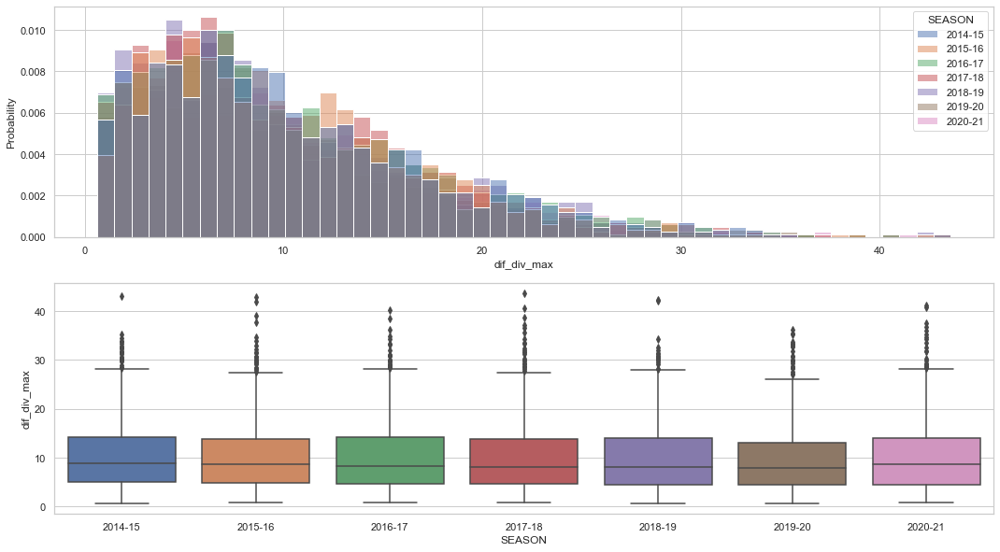

In [10]:
diff_by_game['dif_div_max'] = diff_by_game.eval('dif / PTS_max * 100')

_, ax = plt.subplots(2, 1, figsize=(18, 10))
sns.histplot(data=diff_by_game, x='dif_div_max', stat='probability', bins=50, 
             hue='SEASON', ax=ax[0])
sns.boxplot(data=diff_by_game, y='dif_div_max', x='SEASON', ax=ax[1]);
diff_by_game.groupby('SEASON').dif_div_max.describe()

In [11]:
tt = alt.Chart(diff_by_game, height=400, width=400)
lines = (tt
         .mark_boxplot(color='blue')
         .encode(x=alt.X('SEASON', title='Сезон'), 
                 y=alt.Y('dif_div_max', title='Нормированная разница в счёте', 
                        )
                )
        )

(lines
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

alt.Chart(...)

In [12]:
diff_by_game.GAME_ID.astype(str).str[:3].value_counts(dropna=False)

218    1230
215    1230
217    1230
214    1230
216    1230
220    1080
219    1059
Name: GAME_ID, dtype: int64

# ties and changes

In [13]:
ties_by_game = (df_infos
                .groupby('GAME_ID')
                .agg({'LARGEST_LEAD': ('min', 'max'),
                      'LEAD_CHANGES': ('first'),
                      'TIMES_TIED': ('first')})
                .reset_index()
               )
print(ties_by_game.shape)
ties_by_game['SEASON'] = ties_by_game.GAME_ID.astype(str).str[1:3].astype(int).map(lambda i: f'20{i}-{i+1}')
ties_by_game.columns = ["_".join([c for c in cc if c not in ['first', '']]) for cc in ties_by_game.columns]
ties_by_game.head()

(8289, 5)


,GAME_ID,LARGEST_LEAD_min,LARGEST_LEAD_max,LEAD_CHANGES,TIMES_TIED,SEASON
0,21400001,6,23,7,6,2014-15
1,21400002,10,10,17,11,2014-15
2,21400003,1,27,2,0,2014-15
3,21400004,4,24,7,11,2014-15
4,21400005,10,14,9,5,2014-15


0.10158040776933284


,count,mean,std,min,25%,50%,75%,max
SEASON,,,,,,,,
2014-15,1230.0,5.064228,4.021497,0.0,2.0,4.0,8.00,21.0
2015-16,1230.0,5.218699,4.239971,0.0,2.0,4.0,8.00,23.0
2016-17,1230.0,5.194309,4.051596,0.0,2.0,5.0,8.00,22.0
2017-18,1230.0,5.290244,4.189314,0.0,2.0,4.0,8.00,22.0
2018-19,1230.0,5.426016,4.409728,0.0,2.0,4.0,8.00,26.0
2019-20,1059.0,5.067044,3.948180,0.0,2.0,4.0,7.00,23.0
2020-21,1080.0,4.953704,3.946783,0.0,2.0,4.0,7.25,20.0


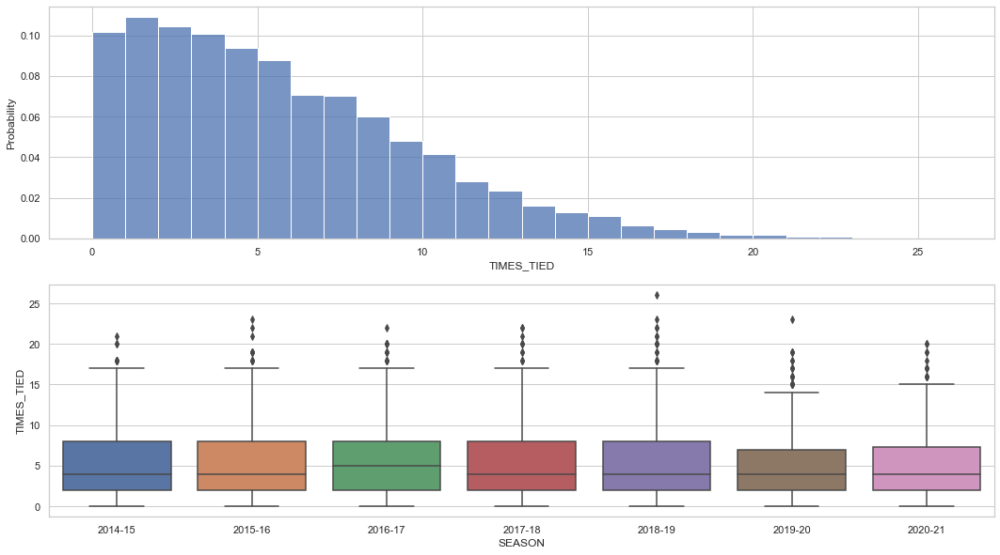

In [14]:
_, ax = plt.subplots(2, 1, figsize=(18, 10))
print((ties_by_game.TIMES_TIED == 0).mean())
sns.histplot(data=ties_by_game, x='TIMES_TIED', stat='probability', bins=ties_by_game.TIMES_TIED.max(), 
#              hue='SEASON', 
             ax=ax[0])
sns.boxplot(data=ties_by_game, y='TIMES_TIED', x='SEASON', ax=ax[1]);
ties_by_game.groupby('SEASON').TIMES_TIED.describe()

0.11207624562673422


,count,mean,std,min,25%,50%,75%,max
SEASON,,,,,,,,
2014-15,1230.0,5.982927,5.046460,0.0,2.0,5.0,9.0,35.0
2015-16,1230.0,6.456911,5.435412,0.0,2.0,5.0,10.0,37.0
2016-17,1230.0,6.447967,5.459979,0.0,2.0,5.0,10.0,32.0
2017-18,1230.0,6.834959,5.654372,0.0,2.0,6.0,10.0,33.0
2018-19,1230.0,7.050407,5.930632,0.0,2.0,6.0,10.0,32.0
2019-20,1059.0,6.656280,5.365725,0.0,2.0,6.0,10.0,29.0
2020-21,1080.0,6.662963,5.604291,0.0,2.0,6.0,10.0,33.0


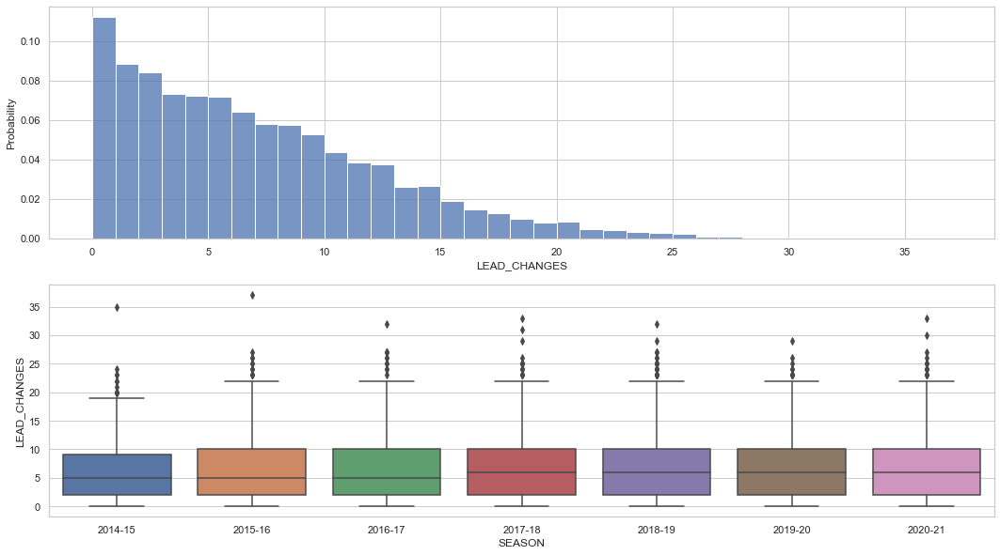

In [15]:
_, ax = plt.subplots(2, 1, figsize=(18, 10))
print((ties_by_game.LEAD_CHANGES == 0).mean())
sns.histplot(data=ties_by_game, x='LEAD_CHANGES', stat='probability', bins=ties_by_game.LEAD_CHANGES.max(), 
#              hue='SEASON', 
             ax=ax[0])
sns.boxplot(data=ties_by_game, y='LEAD_CHANGES', x='SEASON', ax=ax[1]);
ties_by_game.groupby('SEASON').LEAD_CHANGES.describe()

In [16]:
df_infos[df_infos.TIMES_TIED == 0]

,LEAGUE_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY,PTS_PAINT,PTS_2ND_CHANCE,PTS_FB,LARGEST_LEAD,LEAD_CHANGES,TIMES_TIED,TEAM_TURNOVERS,TOTAL_TURNOVERS,TEAM_REBOUNDS,PTS_OFF_TO,GAME_ID
0,0,1610612745,HOU,Houston,34,20,22,27,2,0,1,14,17,15,21400003
1,0,1610612747,LAL,Los Angeles,40,4,13,1,2,0,2,13,17,17,21400003
0,0,1610612762,UTA,Utah,28,19,13,0,0,0,0,16,1,23,21400019
1,0,1610612742,DAL,Dallas,52,17,13,30,0,0,0,9,7,11,21400019
0,0,1610612764,WAS,Washington,44,4,7,17,0,0,0,19,10,20,21400031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,0,1610612747,LAL,Los Angeles,62,7,12,15,0,0,1,10,10,9,22001072
0,0,1610612757,POR,Portland,46,16,13,27,0,0,1,14,6,21,22001076
1,0,1610612743,DEN,Denver,44,15,11,0,0,0,0,6,7,5,22001076
0,0,1610612762,UTA,Utah,42,15,17,29,2,0,0,16,6,13,22001077


In [17]:
df = pd.merge(diff_by_game, ties_by_game, on='GAME_ID', how='left', suffixes=('', '_y'))
df['ties_and_changes'] = df.TIMES_TIED + df.LEAD_CHANGES
print(df.shape)
df.head(2)

(8289, 16)


,GAME_ID,PTS_min,PTS_max,GAME_DATE_EST,SEASON,dif,ssum,game_date,year_mon,dif_div_max,LARGEST_LEAD_min,LARGEST_LEAD_max,LEAD_CHANGES,TIMES_TIED,SEASON_y,ties_and_changes
0,21400001,84,101,2014-10-28T00:00:00,2014-15,17,185,2014-10-28,2014-10,16.831683,6,23,7,6,2014-15,13
1,21400002,100,101,2014-10-28T00:00:00,2014-15,1,201,2014-10-28,2014-10,0.990099,10,10,17,11,2014-15,28


,count,mean,std,min,25%,50%,75%,max
SEASON,,,,,,,,
2014-15,1230.0,11.047154,8.441888,0.0,4.0,10.0,17.00,49.0
2015-16,1230.0,11.675610,9.025034,0.0,4.0,10.0,17.75,47.0
2016-17,1230.0,11.642276,8.889732,0.0,4.0,10.0,17.00,49.0
2017-18,1230.0,12.125203,9.205224,0.0,5.0,10.0,18.00,48.0
2018-19,1230.0,12.476423,9.715431,0.0,5.0,11.0,18.00,52.0
2019-20,1059.0,11.723324,8.601772,0.0,5.0,10.0,17.50,46.0
2020-21,1080.0,11.616667,8.928368,0.0,4.0,10.0,17.00,50.0


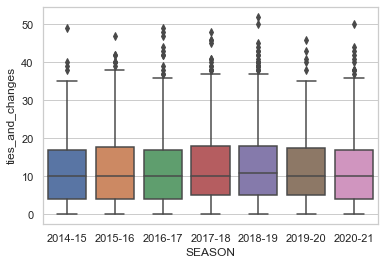

In [18]:
sns.boxplot(data=df, y='ties_and_changes', x='SEASON');
df.groupby('SEASON').ties_and_changes.describe()

In [19]:
# %pip install vega

In [20]:
# alt.renderers.enable('notebook')

In [21]:
tt = alt.Chart(df, height=400, width=400)
lines = (tt
         .mark_boxplot(size=25, color='blue')
         .encode(x=alt.X('SEASON', title='Сезон'), 
                 y=alt.Y('ties_and_changes', title='Равный счёт и смены лидерства', 
                        )
                )
        )

(lines
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

h1 = lines

bar = tt.mark_bar().encode(
    x=alt.X('ties_and_changes:Q', bin=alt.Bin(maxbins=df.ties_and_changes.max()), title='Равный счёт и смены лидерства', 
            axis=alt.Axis(values=np.arange(1, df.ties_and_changes.max(), 5))),
    y=alt.Y('count()', title='Сколько раз встречалась')
)

# rule = base.mark_rule(opacity=.5, color='red', tooltip='fff').encode(
#     x=alt.X('median(dif):Q'),
#     size=alt.value(5)
# )

h2 = bar# + rule
(alt.hconcat(h1, h2)
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

alt.HConcatChart(...)

0.3423000038577198


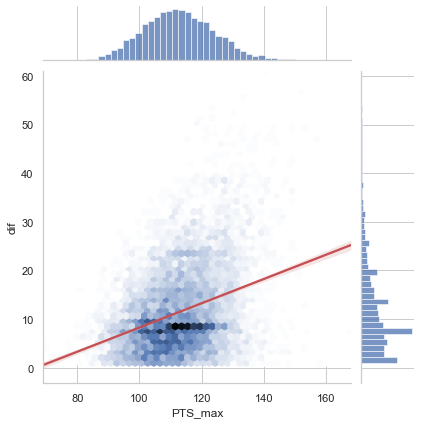

In [22]:
ax = sns.jointplot(data=df, kind='hex', y='dif', x='PTS_max', marginal_kws={'bins': 50})
print(df[['dif', 'PTS_max']].corr().iloc[0, 1])
sns.regplot(data=df, y='dif', x='PTS_max', scatter=False, line_kws={'color': 'r'}, ax=ax.ax_joint);

In [23]:
sc_plot1 = alt.Chart(df).mark_circle().encode(fillOpacity=alt.FillOpacityValue(.2),
    y=alt.Y('dif', title='Разница в счёте'), 
    x=alt.X('PTS_max', title='Очков у победителя', scale=alt.Scale(domain=[60, 180]))
)

sc_plot2 = alt.Chart(df).mark_circle().encode(fillOpacity=alt.FillOpacityValue(.2),
    y=alt.Y('ties_and_changes', title='Равный счёт и смены лидерства'), 
    x=alt.X('PTS_max', title='Очков у победителя', scale=alt.Scale(domain=[60, 180])),
#     color='SEASON'
)

(alt.hconcat(
    sc_plot1 + sc_plot1.transform_regression('PTS_max', 'dif').mark_line(color='red'),
    sc_plot2 + sc_plot2.transform_regression('PTS_max', 'ties_and_changes').mark_line(color='red'))
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

alt.HConcatChart(...)

-0.04128474658380491


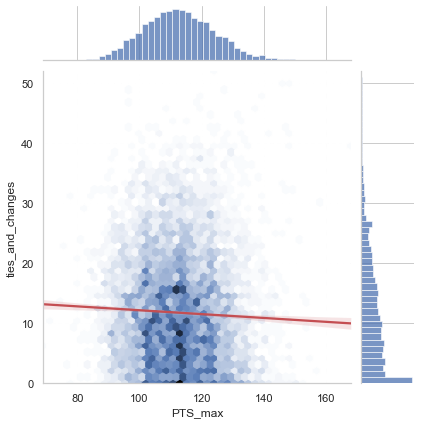

In [24]:
ax = sns.jointplot(data=df, kind='hex', y='ties_and_changes', x='PTS_max', marginal_kws={'bins': 50})
print(df[['ties_and_changes', 'PTS_max']].corr().iloc[0, 1])
sns.regplot(data=df, y='ties_and_changes', x='PTS_max', scatter=False, line_kws={'color': 'r'}, ax=ax.ax_joint);

In [25]:
tt = df.groupby(['PTS_max', 'ties_and_changes']).GAME_ID.count().to_frame('cnt').reset_index()
print(tt.shape, df.shape)
tt.head()

(1762, 3) (8289, 16)


,PTS_max,ties_and_changes,cnt
0,69,6,1
1,71,10,1
2,74,13,1
3,76,3,1
4,76,23,1


In [26]:
df[['ties_and_changes', 'PTS_max', 'dif']].corr()

,ties_and_changes,PTS_max,dif
ties_and_changes,1.000000,-0.041285,-0.38489
PTS_max,-0.041285,1.000000,0.34230
dif,-0.384890,0.342300,1.00000


In [27]:
top = df.sort_values('ties_and_changes', ascending=False).head(7)
top

,GAME_ID,PTS_min,PTS_max,GAME_DATE_EST,SEASON,dif,ssum,game_date,year_mon,dif_div_max,LARGEST_LEAD_min,LARGEST_LEAD_max,LEAD_CHANGES,TIMES_TIED,SEASON_y,ties_and_changes
4965,21800046,124,125,2018-10-22T00:00:00,2018-19,1,249,2018-10-22,2018-10,0.800000,5,10,29,23,2018-19,52
5399,21800480,146,149,2018-12-22T00:00:00,2018-19,3,295,2018-12-22,2018-12,2.013423,7,8,24,26,2018-19,50
8127,22000919,143,146,2021-04-26T00:00:00,2020-21,3,289,2021-04-26,2021-04,2.054795,7,9,30,20,2020-21,50
3109,21600650,123,127,2017-01-21T00:00:00,2016-17,4,250,2017-01-21,2017-01,3.149606,6,11,27,22,2016-17,49
112,21400113,95,97,2014-11-12T00:00:00,2014-15,2,192,2014-11-12,2014-11,2.061856,5,10,35,14,2014-15,49
2672,21600213,114,119,2016-11-23T00:00:00,2016-17,5,233,2016-11-23,2016-11,4.201681,5,8,32,16,2016-17,48
4496,21700807,138,140,2018-02-07T00:00:00,2017-18,2,278,2018-02-07,2018-02,1.428571,4,8,33,15,2017-18,48


In [28]:
tt = (df_infos
 .groupby('GAME_ID')
 .TEAM_ABBREVIATION.agg(lambda s: " против ".join(s))
 .reset_index()
)

In [29]:
_t = pd.merge(top, tt, on='GAME_ID', how='left')
_t

,GAME_ID,PTS_min,PTS_max,GAME_DATE_EST,SEASON,dif,ssum,game_date,year_mon,dif_div_max,LARGEST_LEAD_min,LARGEST_LEAD_max,LEAD_CHANGES,TIMES_TIED,SEASON_y,ties_and_changes,TEAM_ABBREVIATION
0,21800046,124,125,2018-10-22T00:00:00,2018-19,1,249,2018-10-22,2018-10,0.800000,5,10,29,23,2018-19,52,WAS против POR
1,21800480,146,149,2018-12-22T00:00:00,2018-19,3,295,2018-12-22,2018-12,2.013423,7,8,24,26,2018-19,50,PHX против WAS
2,22000919,143,146,2021-04-26T00:00:00,2020-21,3,289,2021-04-26,2021-04,2.054795,7,9,30,20,2020-21,50,WAS против SAS
3,21600650,123,127,2017-01-21T00:00:00,2016-17,4,250,2017-01-21,2017-01,3.149606,6,11,27,22,2016-17,49,POR против BOS
4,21400113,95,97,2014-11-12T00:00:00,2014-15,2,192,2014-11-12,2014-11,2.061856,5,10,35,14,2014-15,49,ORL против NYK
5,21600213,114,119,2016-11-23T00:00:00,2016-17,5,233,2016-11-23,2016-11,4.201681,5,8,32,16,2016-17,48,SAS против CHA
6,21700807,138,140,2018-02-07T00:00:00,2017-18,2,278,2018-02-07,2018-02,1.428571,4,8,33,15,2017-18,48,MIN против CLE


In [30]:
import locale
locale.setlocale(locale.LC_ALL, 'ru_RU.UTF-8')
_t.game_date.dt.strftime('%d %B %Y')

0    22 октября 2018
1    22 декабря 2018
2     26 апреля 2021
3     21 января 2017
4     12 ноября 2014
5     23 ноября 2016
6    07 февраля 2018
Name: game_date, dtype: object

In [31]:
for l in pd.merge(top, tt, on='GAME_ID', how='left').apply(lambda r: f"{r.TEAM_ABBREVIATION} {r.game_date.strftime('%d %B %Y')}: {r.TIMES_TIED}≡ {r.LEAD_CHANGES}🔃", axis=1):
    print(l)

WAS против POR 22 октября 2018: 23≡ 29🔃
PHX против WAS 22 декабря 2018: 26≡ 24🔃
WAS против SAS 26 апреля 2021: 20≡ 30🔃
POR против BOS 21 января 2017: 22≡ 27🔃
ORL против NYK 12 ноября 2014: 14≡ 35🔃
SAS против CHA 23 ноября 2016: 16≡ 32🔃
MIN против CLE 07 февраля 2018: 15≡ 33🔃


# ballots

In [32]:
df['pts_pair'] = df.apply(lambda r: (r.PTS_max, r.PTS_min), axis=1)
def get_ballot_proba(p, q):
    return abs(p - q)/(p + q)
df['total_lead_proba'] = df.apply(lambda r: get_ballot_proba(r.PTS_max, r.PTS_min), axis=1)
df.pts_pair.value_counts().sort_values().tail()

(112, 107)    25
(112, 106)    25
(105, 100)    27
(111, 104)    29
(109, 104)    29
Name: pts_pair, dtype: int64

In [33]:
df[df.pts_pair == (113, 104)]

,GAME_ID,PTS_min,PTS_max,GAME_DATE_EST,SEASON,dif,ssum,game_date,year_mon,dif_div_max,LARGEST_LEAD_min,LARGEST_LEAD_max,LEAD_CHANGES,TIMES_TIED,SEASON_y,ties_and_changes,pts_pair,total_lead_proba
1495,21500266,104,113,2015-12-01T00:00:00,2015-16,9,217,2015-12-01,2015-12,7.964602,11,14,7,5,2015-16,12,"(113, 104)",0.041475
2288,21501059,104,113,2016-03-23T00:00:00,2015-16,9,217,2016-03-23,2016-03,7.964602,2,13,4,3,2015-16,7,"(113, 104)",0.041475
2291,21501062,104,113,2016-03-23T00:00:00,2015-16,9,217,2016-03-23,2016-03,7.964602,6,14,14,8,2015-16,22,"(113, 104)",0.041475
2461,21600002,104,113,2016-10-25T00:00:00,2016-17,9,217,2016-10-25,2016-10,7.964602,8,13,11,7,2016-17,18,"(113, 104)",0.041475
3074,21600615,104,113,2017-01-16T00:00:00,2016-17,9,217,2017-01-16,2017-01,7.964602,10,15,11,12,2016-17,23,"(113, 104)",0.041475
3294,21600835,104,113,2017-02-15T00:00:00,2016-17,9,217,2017-02-15,2017-02,7.964602,8,17,2,3,2016-17,5,"(113, 104)",0.041475
3820,21700131,104,113,2017-11-04T00:00:00,2017-18,9,217,2017-11-04,2017-11,7.964602,1,12,6,6,2017-18,12,"(113, 104)",0.041475
5003,21800084,104,113,2018-10-28T00:00:00,2018-19,9,217,2018-10-28,2018-10,7.964602,4,15,8,10,2018-19,18,"(113, 104)",0.041475
5202,21800283,104,113,2018-11-24T00:00:00,2018-19,9,217,2018-11-24,2018-11,7.964602,1,16,2,2,2018-19,4,"(113, 104)",0.041475
5350,21800431,104,113,2018-12-15T00:00:00,2018-19,9,217,2018-12-15,2018-12,7.964602,4,16,17,9,2018-19,26,"(113, 104)",0.041475


In [34]:
(df
 .groupby('SEASON')
 .dif.agg(lambda s: (s >= 20).mean())
)

SEASON
2014-15    0.142276
2015-16    0.142276
2016-17    0.155285
2017-18    0.136585
2018-19    0.182927
2019-20    0.167139
2020-21    0.189815
Name: dif, dtype: float64

In [35]:
lead_col = 'LEAD_CHANGES'
# 'ties_and_changes' # 'LEAD_CHANGES'
ballots = (df
 .groupby('pts_pair')
 .agg({'GAME_ID': 'count',
       'PTS_max': 'first',
       'PTS_min': 'first',
       lead_col: lambda s: (s <= 0).mean(),
       'total_lead_proba': 'first'})
 .reset_index()
 .rename(columns={'GAME_ID': 'cnt', 
                  lead_col: 'empiric_rate', 
                  'total_lead_proba': 'formula_proba'})
 .sort_values('cnt', ascending=False)
)

ballots['ssum'] = ballots.PTS_max + ballots.PTS_min
ballots['dif'] = ballots.PTS_max - ballots.PTS_min

ballots.head(15)

,pts_pair,cnt,PTS_max,PTS_min,empiric_rate,formula_proba,ssum,dif
543,"(109, 104)",29,109,104,0.034483,0.023474,213,5
608,"(111, 104)",29,111,104,0.172414,0.032558,215,7
422,"(105, 100)",27,105,100,0.000000,0.024390,205,5
643,"(112, 106)",25,112,106,0.040000,0.027523,218,6
644,"(112, 107)",25,112,107,0.080000,0.022831,219,5
481,"(107, 100)",25,107,100,0.000000,0.033816,207,7
512,"(108, 101)",24,108,101,0.083333,0.033493,209,7
640,"(112, 103)",23,112,103,0.043478,0.041860,215,9
449,"(106, 98)",23,106,98,0.086957,0.039216,204,8
480,"(107, 99)",22,107,99,0.136364,0.038835,206,8


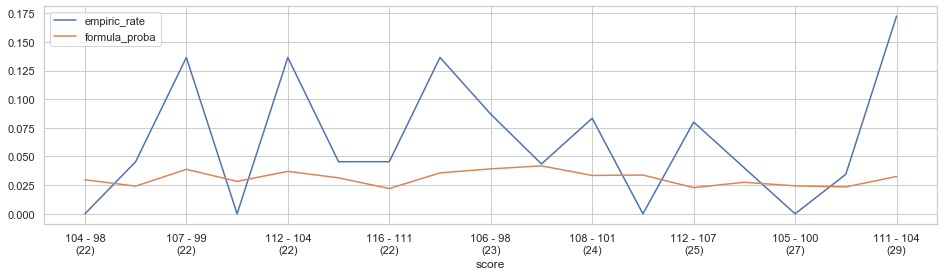

In [89]:
_, ax = plt.subplots(figsize=(16, 4))
_tt = ballots[(ballots.cnt >= 22)].copy()
_tt['score'] = _tt.PTS_max.astype(str) + ' - ' + _tt.PTS_min.astype(str) + '\n(' + _tt.cnt.astype(str) + ')'
_tt['sort_order'] = _tt.cnt.astype(str) + '_' + _tt.score.str[:3]

_ll = _tt.set_index('score').sort_values('sort_order')
_ll[['empiric_rate', 'formula_proba']].plot(ax=ax);

In [91]:
_rr = (_tt
 .set_index('score')
       .sort_values('sort_order')
[['empiric_rate', 'formula_proba', 'sort_order']]
          .rename(columns={'empiric_rate': 'По данным',
                           'formula_proba': 'По формуле'})
         .reset_index()
         .melt(id_vars=['score', 'sort_order'],  
               value_name='points')
         )
_rr.head(2)

,score,sort_order,variable,points
0,104 - 98\n(22),22_104,По данным,0.000000
1,106 - 101\n(22),22_106,По данным,0.045455


In [92]:
tt = alt.Chart(_rr, height=300, width=700)
lines = (tt
         .mark_line()
         .encode(x=alt.X('score', 
                         sort=alt.EncodingSortField('sort_order'), 
                         title='Счёт\n(сколько раз встретился такой счёт)'), 
                 y=alt.Y('points', title='Доля игр без смены лидера'),
                 color=alt.Color('variable', title='')
                )
        )

(lines
 .configure_legend(labelFontSize=15)
 .configure_axis(
        labelFontSize=15,
        titleFontSize=15
    )
)

alt.Chart(...)

In [36]:
ballots.sort_values('ssum', ascending=False).query('dif == 16').head(15)

,pts_pair,cnt,PTS_max,PTS_min,empiric_rate,formula_proba,ssum,dif
1550,"(142, 126)",1,142,126,0.000000,0.059701,268,16
1517,"(140, 124)",1,140,124,0.000000,0.060606,264,16
1496,"(139, 123)",1,139,123,1.000000,0.061069,262,16
1481,"(138, 122)",1,138,122,0.000000,0.061538,260,16
1463,"(137, 121)",2,137,121,0.000000,0.062016,258,16
1418,"(135, 119)",1,135,119,0.000000,0.062992,254,16
1393,"(134, 118)",1,134,118,0.000000,0.063492,252,16
1331,"(132, 116)",2,132,116,1.000000,0.064516,248,16
1295,"(131, 115)",2,131,115,0.500000,0.065041,246,16
1268,"(130, 114)",6,130,114,0.166667,0.065574,244,16


In [37]:
diff_by_game.query('ssum == 268')

,GAME_ID,PTS_min,PTS_max,GAME_DATE_EST,SEASON,dif,ssum,game_date,year_mon,dif_div_max
5572,21800653,126,142,2019-01-15T00:00:00,2018-19,16,268,2019-01-15,2019-01,11.267606
5810,21800891,128,140,2019-02-23T00:00:00,2018-19,12,268,2019-02-23,2019-02,8.571429
6452,21900303,133,135,2019-12-03T00:00:00,2019-20,2,268,2019-12-03,2019-12,1.481481
6841,21900692,129,139,2020-01-26T00:00:00,2019-20,10,268,2020-01-26,2020-01,7.194245
7174,21901284,132,136,2020-08-08T00:00:00,2019-20,4,268,2020-08-08,2020-08,2.941176


# to remove

In [38]:
breakflow

NameError: name 'breakflow' is not defined

In [ ]:
g = df[df.GAME_ID == 22000700].copy()
g.head()

In [ ]:
def get_minute(row):
    per = row['PERIOD']
    tt = row['PCTIMESTRING']
    mm, ss = [int(s) for s in tt.split(':')]
    return per * 12. - (mm + ss / 60)

g['game_minute'] = g.apply(get_minute, axis=1)

In [ ]:
def parse_score(score_str):
    if pd.notna(score_str):
        return [int(s) for s in score_str.split(' - ')]
    return None

scores = g.set_index('game_minute').SCORE.map(parse_score).dropna()
scores.iloc[:5]

In [ ]:
scores.map(lambda p: p[0]).plot()

In [ ]:
def plot_scores(scores):
    add_0 = scores.iloc[0] != [0, 0]
    sc1 = scores.map(lambda p: p[0])
    sc2 = scores.map(lambda p: p[1])
    ax = sc1.plot(color='b', label='one')
    ax = sc2.plot(color='g', label='two', ax=ax)
    ax.set_xlim(0, 7)
    ax.set_ylim(0, 37)
    
plot_scores(scores)

In [ ]:
def lead_changes(scores):
    sc1 = scores.map(lambda p: p[0])
    sc2 = scores.map(lambda p: p[1])
    diff = (sc1 - sc2) > 0
    return (diff != diff.shift(1)).sum()

lead_changes(scores)

In [ ]:
def get_final_score(g):
    scores = g.SCORE.map(parse_score).dropna()#.sort_index()
    last = scores.iloc[-1]
    return pd.Series(last)

df.groupby('GAME_ID').apply(get_final_score).head()

In [ ]:
import nba_api.stats.endpoints as ep

In [ ]:
rr = ep.boxscoresummaryv2.BoxScoreSummaryV2(game_id='0021900017')
rr

In [ ]:
rr.get_data_frames()[8]#game_info.get_data_frame()

In [ ]:
df[((df.EVENTMSGTYPE == EventMsgType.TIMEOUT.value)
    & (df.PERIOD.isin([1, 2, 3]))
    & (df.PCTIMESTRING < '0:30')
   )].shape